In [1]:
import numpy as np
import cv2
import imageio
import glob
from numpy import linalg as LA
from scipy.io import loadmat
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
import pandas as pd
from sklearn import metrics
from PIL import Image
np.set_printoptions(suppress=True)

Read Dataset

In [2]:
import pandas as pd

# Load the data
metaData = pd.read_csv("wiki_labels.csv")

# Create a DataFrame from the metaData
Data = pd.DataFrame({
    'ID': metaData['ID'],
    'full_path': metaData['full_path'],
    'age': metaData['age']
})

Data.head()


,ID,full_path,age
0,2002,['17/10000217_1981-05-05_2009.png'],27.746119
1,2003,['12/100012_1948-07-03_2008.png'],59.582192
2,2004,['65/10001965_1930-05-23_1961.png'],30.696804
3,2005,['16/10002116_1971-05-31_2012.png'],40.672146
4,2006,['02/10002702_1960-11-09_2012.png'],51.224201


Shuffle the dataset randomly and perform Train-Test Split

In [3]:
from sklearn.model_selection import train_test_split


# Shuffle the dataset randomly
Data_shuffled = Data.sample(frac=1, random_state=42)  # Random state for reproducibility

# Perform an 80/20 split for training and testing
train_data, test_data = train_test_split(Data_shuffled, test_size=0.2, random_state=42)

# Reset the indices
train_data = train_data.reset_index(drop=True)
test_data = test_data.reset_index(drop=True)

# Print the sizes of training and test sets
print(f"Training set size: {len(train_data)}")
print(f"Test set size: {len(test_data)}")


Training set size: 48261
Test set size: 12066


In [4]:
#accessing the images and storing in matrix
train_matrix=np.zeros((train_data.shape[0],10000))
test_matrix=np.zeros((test_data.shape[0],10000))
path_train=train_data['full_path']
path_test=test_data['full_path']
folders = ('wiki_labeled\wiki_labeled')

In [5]:
#creating a matrix for training data

# Initialize the train_matrix
train_matrix = np.zeros((train_data.shape[0], 10000))

# Define the folder path
folders = 'wiki_labeled/wiki_labeled/'

# Iterate through the rows of train_data
for matIndex in range(train_data.shape[0]):
    try:
        # Get the path without square brackets and single quotes
        path = path_train.values[matIndex].strip("[]'")

        # Check if ':' is not found in the path
        if (path.find(':') == -1):
            # Split the path into folder and filename
            folder, filename = path.split('/')
            file = folders + f'{folder}/{filename}'
            im = cv2.imread(file, 0)
            if im is not None:
                train_matrix[matIndex, :] = im.reshape(1, 10000)
            else:
                print(f"Error reading file: {file}")
        else:
            # Handle the case where ':' is found in the path (if needed)
            pass
    except Exception as e:
        print(f"An error occurred: {e}")


In [6]:
#creating a matrix for testing data
# Initialize the test_matrix
test_matrix = np.zeros((test_data.shape[0], 10000))

# Iterate through the rows of test_data
for matIndex in range(test_data.shape[0]):
    try:
        # Get the path without square brackets and single quotes
        path = path_test.values[matIndex].strip("[]'")

        # Check if ':' is not found in the path
        if (path.find(':') == -1):
            # Split the path into folder and filename
            folder, filename = path.split('/')
            file = folders + f'{folder}/{filename}'
            im = cv2.imread(file, 0)
            if im is not None:
                test_matrix[matIndex, :] = im.reshape(1, 10000)
            else:
                print(f"Error reading file: {file}")
        else:
            # Handle the case where ':' is found in the path (if needed)
            pass
    except Exception as e:
        print(f"An error occurred: {e}")


Compute principal components (i.e., eigenfaces)

In [7]:
afv=train_matrix.mean(0)
print("AFV",afv.shape)

AFV (10000,)


In [8]:
A=train_matrix-afv
print("A",A.shape)

A (48261, 10000)


In [9]:
C=(np.dot(A.T,A))/(train_data.shape[0]-1)
print("C",C.shape)

C (10000, 10000)


In [10]:
w, v = LA.eig(C)
print("Eigenvalues shape: ",w.shape)
print("Eigen Vectors shape: ",v.shape)

Eigenvalues shape:  (10000,)
Eigen Vectors shape:  (10000, 10000)


In [11]:
eig_pairs = [(np.abs(w[i]), v[:,i]) for i in range(len(w))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)

In [12]:
eig_vec=np.zeros((10000,10000))
for i in range (0,10000):
    eig_vec[:,i]=eig_pairs[i][1]
eig_vec

array([[ 0.01189924, -0.01571641, -0.00710394, ..., -0.00041126,
        -0.00035466,  0.00083069],
       [ 0.01188666, -0.01571724, -0.00727974, ...,  0.0026643 ,
        -0.00165294, -0.00063134],
       [ 0.01187858, -0.01572469, -0.00746906, ..., -0.00021213,
        -0.00435871, -0.00001361],
       ...,
       [ 0.00904031, -0.00091287,  0.01755825, ...,  0.00064972,
        -0.00080088, -0.00046691],
       [ 0.0090613 , -0.00112959,  0.01738016, ..., -0.00004635,
         0.00100996, -0.00043844],
       [ 0.00908721, -0.00128933,  0.01719695, ...,  0.00070727,
        -0.00008569,  0.00004336]])

scree plot to choose the best value for K that denotes number
of principal components to keep.

Text(0, 0.5, 'Eigenvalue')

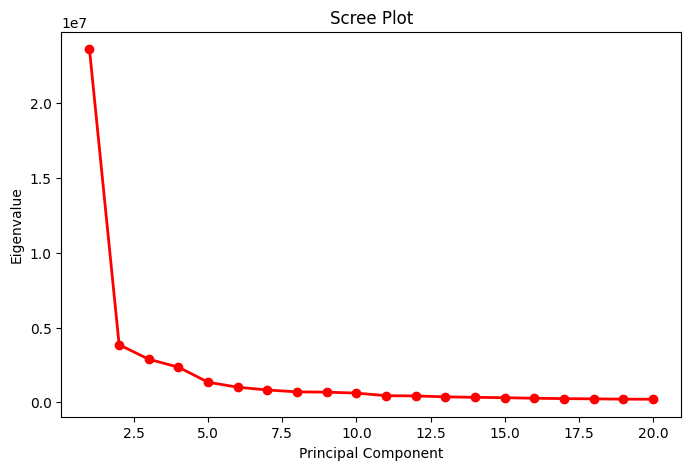

In [13]:
fig = plt.figure(figsize=(8,5))
sing_vals = np.arange(20) + 1
plt.plot(sing_vals, w[:20], 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')

In [14]:
k = 15 # must try 20

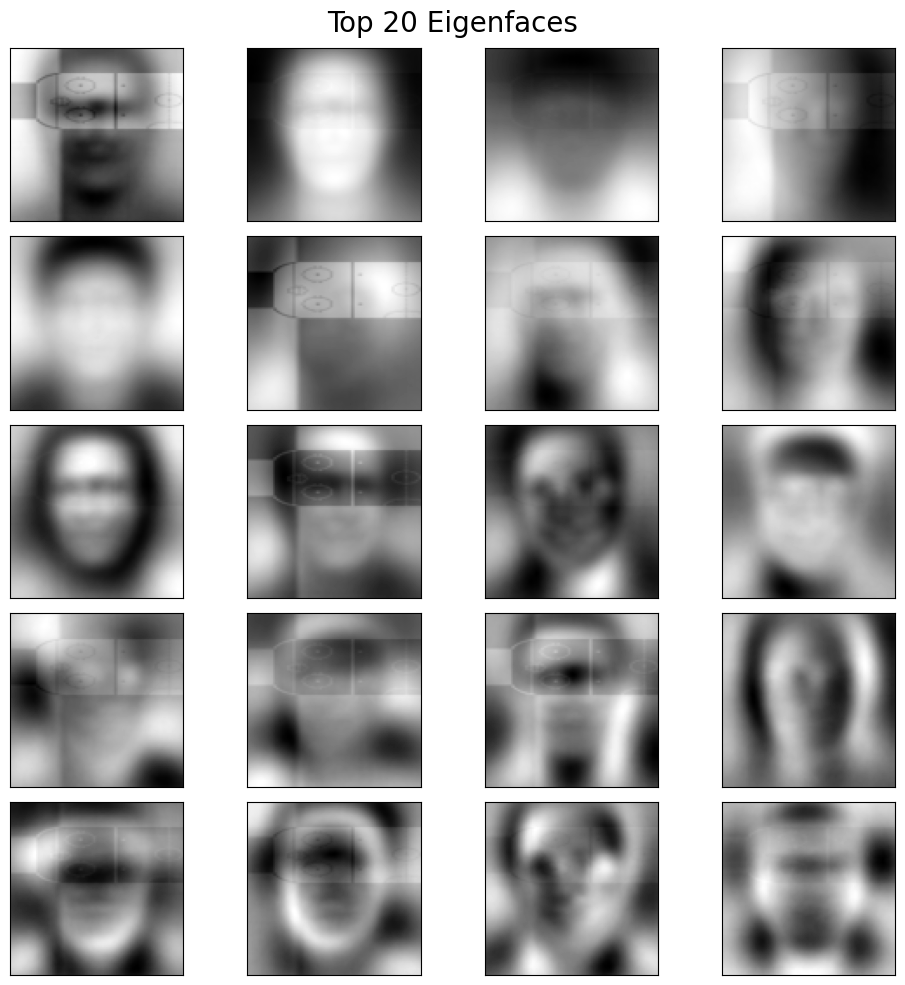

In [15]:
# Take the first 20 eigenvectors
eigenfaces = eig_vec[:,:20]  

fig, ax = plt.subplots(5, 4, figsize=(10,10))

# Loop through first 20 eigenvectors
for i in range(20):
    axi = ax.flat[i]
    axi.imshow(eigenfaces[:,i].reshape(100,100), cmap='gray')
    axi.set_xticks([])
    axi.set_yticks([])

plt.suptitle('Top 20 Eigenfaces', size=20)
plt.tight_layout()

plt.show()

Projecting Train and test images to eigen faces

In [16]:

X_train=np.dot(train_matrix,eig_vec.T[:,:k])

In [17]:
X_test=np.dot(test_matrix,eig_vec.T[:,:k])

In [18]:
X_train_max=X_train.max()
X_train_min=X_train.min()

X_test_max=X_test.max()
X_test_min=X_test.min()

Normalizing data

In [19]:
X_train=(X_train-X_train.min())/(X_train.max()-X_train.min())
ones = np.ones([X_train.shape[0],1])
X_train = np.concatenate((ones,X_train),axis=1)

In [20]:
X_test=(X_test-X_test.min())/(X_test.max()-X_test.min())
ones = np.ones([X_test.shape[0],1])
X_test = np.concatenate((ones,X_test),axis=1)

In [21]:
y_train = train_data['age']
y_train=y_train.tolist()
a=[]
for value in y_train:
    a.append([value])
a = np.asarray(a)
a.shape
y_train=a
y_train.shape

(48261, 1)

Performing SGD

In [124]:
alpha=0.0001
epochs=7 #must try 8 
theta = np.zeros((1,X_train.shape[1]))

def computeCost(X,y,theta):
    h=np.dot(X,np.transpose(theta))
    tobesummed = np.power((h-y),2)
    return np.sum(tobesummed)/(2 * len(X))

def gradientDescent(X,y,theta,epochs,alpha):
    cost = np.zeros(train_data.shape[0])
    for i in range(epochs):
        for m in range(0,train_data.shape[0]):
            h=np.dot(X,np.transpose(theta))
            error=h[m]-y[m]
            Y= alpha * error * (X[m,:])
            
            theta = theta - Y
            
            cost[m] = computeCost(X, y, theta)
            print(cost[m],m,"(",i,")")
    return theta,cost

#running the gd and cost function
g,cost = gradientDescent(X_train,y_train,theta,epochs,alpha)
print(g)
print(g.shape)

finalCost = computeCost(X_train,y_train,g)
print(finalCost)

901.9885916483602 0 ( 0 )
901.656491022433 1 ( 0 )
900.140897672189 2 ( 0 )
899.6262312839364 3 ( 0 )
899.2745612845475 4 ( 0 )
898.9631856360237 5 ( 0 )
897.934938805685 6 ( 0 )
897.0990219127787 7 ( 0 )
896.7542973378517 8 ( 0 )
895.5758894134168 9 ( 0 )
895.1736777192498 10 ( 0 )
895.1771668807564 11 ( 0 )
894.6526521670143 12 ( 0 )
894.1661507806767 13 ( 0 )
893.6376815418017 14 ( 0 )
893.1931323038967 15 ( 0 )
892.8266787184768 16 ( 0 )
892.3193297755995 17 ( 0 )
891.4761770152338 18 ( 0 )
891.1861949224835 19 ( 0 )
890.6047190506953 20 ( 0 )
890.0542122812273 21 ( 0 )
889.4418482919807 22 ( 0 )
889.0275130902137 23 ( 0 )
888.1132998560851 24 ( 0 )
887.6484923821713 25 ( 0 )
887.4441031900578 26 ( 0 )
886.9893457996012 27 ( 0 )
886.5685957966765 28 ( 0 )
886.1926513153168 29 ( 0 )
885.4037710571456 30 ( 0 )
885.0805324866665 31 ( 0 )
884.5396820330732 32 ( 0 )
884.097165761724 33 ( 0 )
883.7697075170533 34 ( 0 )
883.1561828090258 35 ( 0 )
882.3589688817826 36 ( 0 )
881.94278045170

In [47]:
from sklearn.preprocessing import PolynomialFeatures
# Degree of polynomial 
degree = 3
alpha=0.01
def computeCost1(X,y,theta):
    h = np.dot(X_poly, np.transpose(theta))
    tobesummed = np.power((h-y),2)
    return np.sum(tobesummed)/(2 * len(X))

epochs = 3
# Modify X to add polynomial terms 
X_poly = PolynomialFeatures(degree=degree).fit_transform(X_train)
theta1 = np.zeros((1,X_poly.shape[1]))
#print(X_poly.shape)
def gradientDescentPoly(X, y, theta, epochs, alpha):

    cost = np.zeros(len(y))
    
    for i in range(epochs):
        for m in range(len(y)):
            
            # Predictions 
            h = X @ theta.T
            
            # Error
            error = h[m] - y[m]
            
            # Gradient
            gradient = alpha * error * X[m]
            
            # Update theta
            theta = theta - gradient

            # Compute cost 
            cost[m] = computeCost1(X, y, theta)
            print(cost[m],m,"(",i,")")

    return theta, cost

# Train model on polynomial features  
g1, cost = gradientDescentPoly(X_poly, y_train, theta1, epochs, alpha)
finalCost = computeCost1(X_train,y_train,g1)
print(finalCost)

639.5161904011668 0 ( 0 )
531.2705505271549 1 ( 0 )
244.00535975460974 2 ( 0 )
235.14472478095445 3 ( 0 )
234.1006462374676 4 ( 0 )
244.32965911555274 5 ( 0 )
247.8033171392149 6 ( 0 )
303.6669971857824 7 ( 0 )
246.81536747088964 8 ( 0 )
358.09230912356463 9 ( 0 )
267.7522251320069 10 ( 0 )
303.87540204055796 11 ( 0 )
276.7693582693245 12 ( 0 )
252.3590681626426 13 ( 0 )
241.19444215202495 14 ( 0 )
239.4710842157092 15 ( 0 )
258.1531952441199 16 ( 0 )
264.00527156142954 17 ( 0 )
231.78536152470798 18 ( 0 )
250.61401584682108 19 ( 0 )
233.71383251484232 20 ( 0 )
231.24123205678148 21 ( 0 )
230.62898015271526 22 ( 0 )
241.25858082364945 23 ( 0 )
235.79847119389262 24 ( 0 )
231.49515504767328 25 ( 0 )
238.95901524575225 26 ( 0 )
258.76035756225735 27 ( 0 )
263.62753798972415 28 ( 0 )
285.6767416199182 29 ( 0 )
232.45608957635113 30 ( 0 )
242.30984305819246 31 ( 0 )
234.09104331127816 32 ( 0 )
256.7141258744003 33 ( 0 )
282.05253936234743 34 ( 0 )
250.11476023565248 35 ( 0 )
230.9274248037

KeyboardInterrupt: 

In [31]:

finalCost = computeCost1(X_train,y_train,g1)
finalCost

216.27282409239794

Predicting for the test dataset and calculating RMSE


In [35]:
"""y_test = test_data['age']
y_pred = np.dot(X_test,g1.T)
RMSE=np.sqrt(metrics.mean_squared_error(y_test,y_pred))
print(RMSE)"""
# Transform X_test 
X_test_poly = PolynomialFeatures(degree=degree).fit_transform(X_test)

# Predict on polynomial features  
y_pred = np.dot(X_test_poly, g1.T)

# Evaluation metrics
RMSE = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print(RMSE)

20.499724232572127


Loading And Performing Predictions On Judge Data

In [36]:
# Load the data
metaData = pd.read_csv("wiki_judge.csv")
judge_Data = pd.DataFrame({
    'ID': metaData['ID'],
    'full_path': metaData['full_path'],
})

judge_Data



,ID,full_path
0,1,['1.png']
1,3,['3.png']
2,4,['4.png']
3,5,['5.png']
4,6,['6.png']
...,...,...
1404,1995,['1995.png']
1405,1997,['1997.png']
1406,1998,['1998.png']
1407,1999,['1999.png']


In [37]:
#accessing the images and storing in matrix
judge_matrix=np.zeros((judge_Data.shape[0],10000))
path_judge=judge_Data['full_path']
folders1 = ('wiki_judge_images\wiki_judge_images')

In [38]:
import cv2
import numpy as np

# Assuming judge_Data and folders1 are already defined

# Define the base folder path if needed
folders1 = ('wiki_judge_images\wiki_judge_images')  # Define the correct folder path

# Initialize judge_matrix
judge_matrix = np.zeros((judge_Data.shape[0], 10000))

# Iterate through the rows of judge_Data
for matIndex in range(judge_Data.shape[0]):
    try:
        path = path_judge.values[matIndex].strip("[]'")

        if (path.find(':') == -1):
            if '/' in path:  # Check if there's a forward slash in the path
                folder, filename = path.split('/')
                file = f'{folders1}/{folder}/{filename}'  # Added a missing forward slash
                im = cv2.imread(file, 0)
                if im is not None:
                    judge_matrix[matIndex, :] = im.reshape(1, 10000)
                else:
                    print(f"Error reading file: {file}")
            else:
                # Assuming a pattern in the naming convention, you can generate the full path
                file = f'{folders1}/{path}'  # Adjust the pattern as needed
                im = cv2.imread(file, 0)
                if im is not None:
                    judge_matrix[matIndex, :] = im.reshape(1, 10000)
                else:
                    print(f"Error reading file: {file}")
        else:
            # Handle the case where ':' is found in the path (if needed)
            pass
    except Exception as e:
        print(f"An error occurred: {e}")


In [39]:
X_judge=np.dot(judge_matrix,eig_vec.T[:,:k])
X_judge_max=X_judge.max()
X_judge_min=X_judge.min()

In [40]:
X_judge=(X_judge-X_judge.min())/(X_judge.max()-X_judge.min())
ones = np.ones([X_judge.shape[0],1])
X_judge = np.concatenate((ones,X_judge),axis=1)

In [43]:
#ages_judge=np.dot(X_judge,g.T)
X_judge_poly = PolynomialFeatures(degree=degree).fit_transform(X_judge)

# Make predictions
ages_judge = np.dot(X_judge_poly, g1.T)

In [44]:
i=np.arange(1,len(ages_judge)+1)

In [45]:
predDataFrame = judge_Data[['ID']]
predDataFrame['age'] = ages_judge
predDataFrame.to_csv("Submission1.csv", sep=',',index=False)

In [46]:
predDataFrame

,ID,age
0,1,43.263304
1,3,26.412565
2,4,33.461325
3,5,37.044611
4,6,36.173731
...,...,...
1404,1995,40.424892
1405,1997,34.059545
1406,1998,28.606353
1407,1999,45.051393
